In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import itertools
import pickle
from scipy import signal
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

In [7]:

def calibrate_camera():
    """
    this method will calibrate the camera
    """
    images = glob.glob('camera_cal/*.jpg')

    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.
    x = 1280 # image length
    y=720 # image height

    for idx, fname in enumerate(images):
        img = mpimg.imread(fname)
        ## resize the image if it isn't the same shape
        if img.shape[0] != x:
            img = cv2.resize(img,(x,y), interpolation = cv2.INTER_CUBIC)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        for nx,ny in itertools.permutations(range(9,4,-1),2):
            objp = np.zeros((nx*ny,3), np.float32)
            objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
            if ret:
                break
        objpoints.append(objp)
        imgpoints.append(corners)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (y, x),None,None)
    return mtx, dist

In [8]:
mtx, dist = calibrate_camera()
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

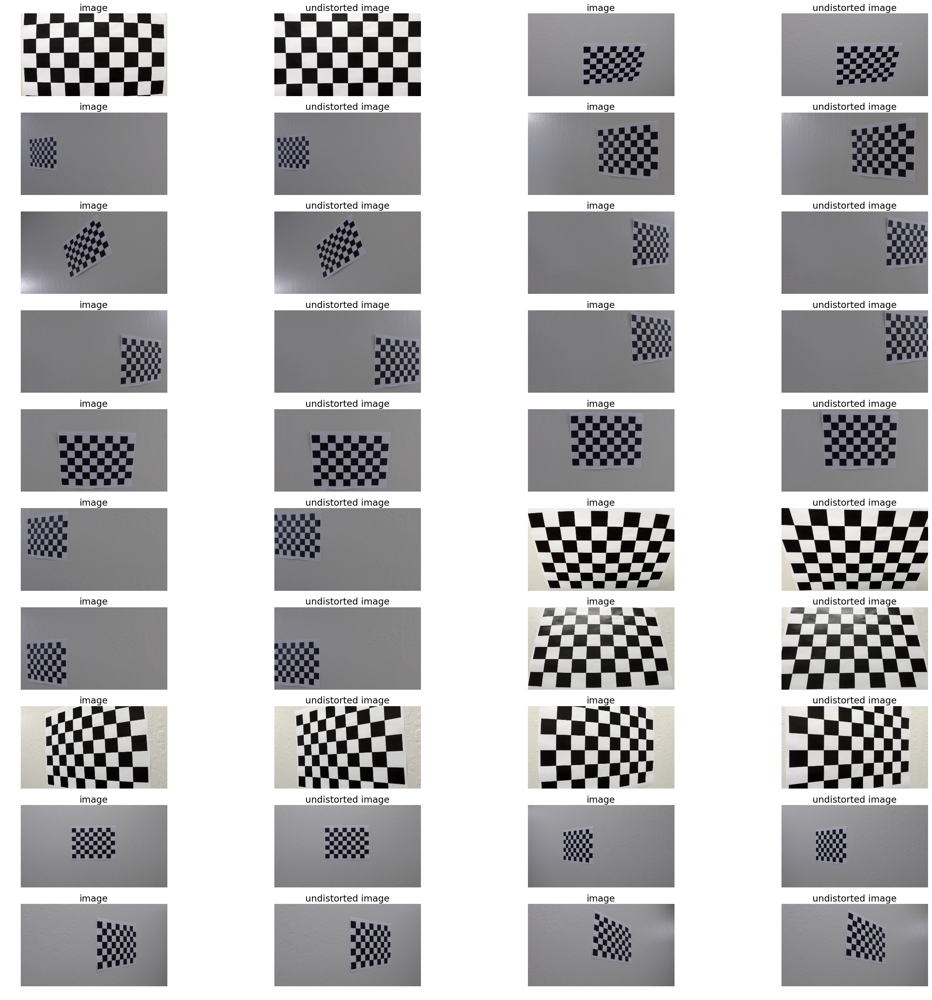

In [6]:
plt.figure(figsize=(32, 32))
plt.rcParams.update({'font.size': 14})
images = glob.glob('camera_cal/*.jpg')
i = 0
x, y= 1280, 720
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    if img.shape[0] != x:
        img = cv2.resize(img,(x,y), interpolation = cv2.INTER_CUBIC)
    plt.subplot(10, 4, i+1)
    plt.title("image")
    plt.axis('off')
    var_holder = plt.imshow(img)
    plt.subplot(10, 4, i+2)
    plt.title("undistorted image")
    plt.axis('off')
    var_holder = plt.imshow(cv2.undistort(img, mtx, dist, None, mtx))
    i += 2
plt.show()

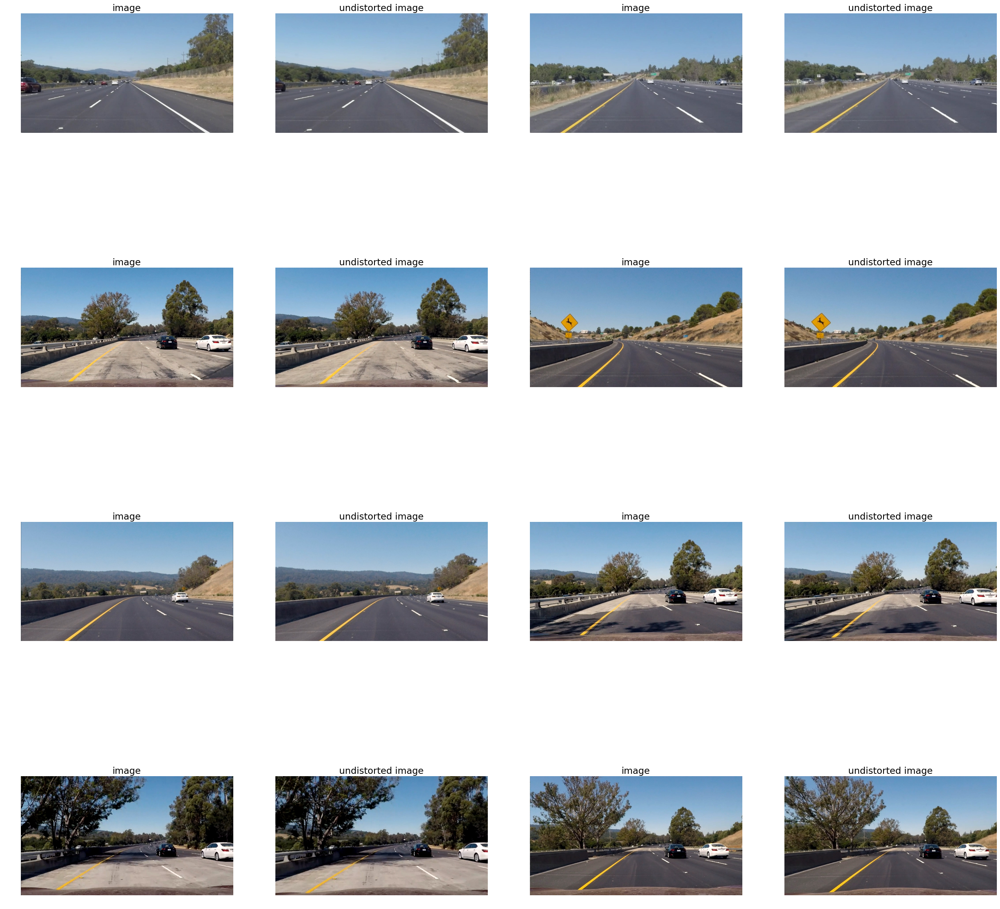

In [9]:
##delete this cell once the code works
test_images = glob.glob('test_images/*.jpg')
i = 0
plt.figure(figsize=(32, 32))
plt.rcParams.update({'font.size': 14})
for idx, fname in enumerate(test_images):
    img = mpimg.imread(fname)
    plt.subplot(4, 4, i+1)
    plt.title("image")
    plt.axis('off')
    var_holder = plt.imshow(img)
    plt.subplot(4, 4, i+2)
    plt.title("undistorted image")
    plt.axis('off')
    var_holder = plt.imshow(cv2.undistort(img, mtx, dist, None, mtx))
    i += 2
plt.show()

In [3]:
dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    else:
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel > thresh[0]) & (scaled_sobel < thresh[1])] = 1
    return grad_binary
    
def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt((sobelx**2) +(sobely**2))
    normalized = magnitude/np.max(magnitude)
    normalized_unit_8 = np.uint8(255*normalized)
    mag_binary = np.zeros_like(normalized_unit_8)
    mag_binary[(normalized_unit_8 > mag_thresh[0]) & (normalized_unit_8 < mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    arctan = np.arctan2(sobely, sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan > thresh[0]) & (arctan < thresh[1])] = 1
    return dir_binary

def hls_s_thresh(image,thresh = (175, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary

def get_lane_lines(img):
    pixel_height = [i for i in range(img.shape[0],0,-20)]
    ranges = [(pixel_height[i+1],pixel_height[i]) if i+1 < len(pixel_height) else (0,pixel_height[i]) for i in range(len(pixel_height)) ]
    left_points = []
    right_points = []
    left_point, right_point = 200,800
    no_previous_left_point, no_previous_right_point = True, True
    for i in ranges:
        hist = np.sum(img[i[0]:i[1],:], axis=0)
        peaks = signal.find_peaks_cwt(hist, [100], max_distances=[100])
        if len(peaks) == 0:
            continue
        temp_left_point = min(peaks, key= lambda x: abs(x-left_point))
        if ((len(left_points) <5 or no_previous_left_point) and temp_left_point < (img.shape[1] /2)-100) or abs(temp_left_point - left_point ) < 20:
            left_point = temp_left_point
            left_points.append((left_point,i[1]))
            no_previous_left_point = False
        else:
            no_previous_left_point = True
        temp_right_point =  min(peaks, key= lambda x: abs(x-right_point))
        if ((len(right_points) <5 or no_previous_right_point) and temp_right_point > (img.shape[1] /2)+100) or abs(temp_right_point - right_point ) < 20:
            right_point = temp_right_point
            right_points.append((right_point,i[1]))
            no_previous_right_point = False
        else:
            no_previous_right_point = True
        
    return left_points, right_points

def reject_outliers_from_fitted_line(list_of_points):
    line_polyfit = np.polyfit( [i[1] for i in list_of_points],[i[0] for i in list_of_points], 2)
    poly_func = np.poly1d(line_polyfit)
    return [i for i in list_of_points if abs(i[0] - poly_func(i[1]) ) < 10.]
    
def reject_outliers_from_array(data, m = 1.5):
    d = np.abs(data - np.median(data))
    mdev = np.median(d)
    s = d/mdev if mdev else 0.
    return data[s<m]

def get_left_right_points(img):
    left_points = []
    right_points = []
    pixel_height = [i for i in range(img.shape[0],0,-20)]
    ranges = [(pixel_height[i+1],pixel_height[i]) if i+1 < len(pixel_height) else (0,pixel_height[i]) for i in range(len(pixel_height)) ]
    for i in ranges:
        hist = np.sum(img[i[0]:i[1],:], axis=0)
        peaks = signal.find_peaks_cwt(hist, [.5], max_distances=[100])
        temp_left_points = []
        temp_right_points = []
        for j in peaks:
            if j > img.shape[1]/2:
                temp_right_points.append(j)
            else:
                temp_left_points.append(j)
        temp_left_points = np.array(temp_left_points)
        temp_right_points = np.array(temp_right_points)
        if len(temp_left_points) > 1:
            temp_left_points = reject_outliers_from_array(np.array(temp_left_points))
            if max(temp_left_points)- min(temp_left_points)  < 50:
                left_points.extend([(x,i[0]) for x in temp_left_points])
            
        if len(temp_right_points) > 1:
            temp_right_points = reject_outliers_from_array(np.array(temp_right_points))
            if max(temp_right_points)- min(temp_right_points)  < 50:
                right_points.extend([(x,i[0]) for x in temp_right_points])
        
        if len(peaks) == 0:
            continue
    left_points,right_points = reject_outliers_from_previous_frame(left_points, right_points)
    #left_points = reject_outliers_from_fitted_line(left_points)
    #right_points = reject_outliers_from_fitted_line(right_points)
    return left_points, right_points

def reject_outliers_from_previous_frame(left_points, right_points):
    global prev_left_fit, prev_right_fit, total_misfits
    
    if prev_left_fit == None or prev_right_fit == None or total_misfits > 1:
        return left_points, right_points
    right_prob = np.poly1d(prev_right_fit)
    left_prob = np.poly1d(prev_left_fit)
    new_left_points, new_right_points = [],[]
    for x,y in left_points:
        if -300 > (x - (left_prob(y) +((right_prob(y) - left_prob(y))/2))) > -400:
            new_left_points.append((x,y)) 
    for x,y in right_points:
        if 300 < (x - (left_prob(y) +((right_prob(y) - left_prob(y))/2))) < 400:
            new_right_points.append((x,y))
    if len(new_left_points) > 2 and len(new_right_points) > 2:
        return new_left_points, new_right_points
    return left_points, right_points

def get_sqaure_error(points, polyfit):
    poly_func = np.poly1d(polyfit)
    return sum([(i[0] - poly_func(i[1]) )**2 for i in points])**0.5
    
def smooth_polys(left_fit, right_fit):
    global prev_left_fit, prev_right_fit
    global total_misfits
    ## if this is the first image frame exit immediately
    if prev_left_fit == None or prev_right_fit == None:
        prev_left_fit, prev_right_fit = left_fit, right_fit
        return left_fit, right_fit
    
    previous_right_error = np.sqrt(np.sum((right_fit-prev_right_fit)**2)/np.sum(prev_right_fit**2))
    
    if previous_right_error > total_misfits*0.05:
        right_fit = prev_right_fit
        left_fit =  prev_left_fit
        total_misfits +=1
    else:
        right_fit = .1 * right_fit +.9 * prev_right_fit
        left_fit =  .1 * left_fit +.9 * prev_left_fit
        prev_left_fit,prev_right_fit = left_fit, right_fit
        total_misfits = 0
    return left_fit, right_fit

def get_threshold_image(image):
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=5, thresh=(30, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=5, thresh=(30, 100))
    mag_binary = mag_thresh(image, sobel_kernel=5, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=5, thresh=(0.7, 1.3))
    hls_thresh = hls_s_thresh(image,thresh = (175, 255))
    combined = np.zeros_like(hls_thresh)
    combined[((gradx == 1) & (grady == 1))|hls_thresh == 1 | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

def get_road_curves(warped_image):
    left_points, right_points = get_left_right_points(warped_image)
    yvals = np.linspace(0, 100, num=101) * warped_image.shape[0]/100
    left_fit = np.polyfit( [i[1] for i in left_points],[i[0] for i in left_points], 2)
    right_fit = np.polyfit( [i[1] for i in right_points],[i[0] for i in right_points], 2)
    left_fit, right_fit = smooth_polys(left_fit, right_fit)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
    return left_fitx, right_fitx,left_points,right_points,left_fit,right_fit
 
def fill_lane_line(left_fitx, right_fitx, warped_image,threshold_image,left_fit,right_fit):
    yvals = np.linspace(0, 100, num=101) * warped_image.shape[0]/100
    warp_zero = np.zeros_like(threshold_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    #left_poly = np.poly1d(left_fit)
    #print(int(left_poly(0)), int(left_poly(warped_image.shape[0])))
    #cv2.line(color_warp,(0,int(left_poly(0))),(warped_image.shape[0],int(left_poly(warped_image.shape[0]))),(255,255,255),5)
    return color_warp

def write_curverad_in_meters(image,left_points,right_points):
    y_eval = image.shape[0]
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit([y*ym_per_pix for x,y in left_points], [x*xm_per_pix for x,y in left_points], 2)
    right_fit_cr = np.polyfit([y*ym_per_pix for x,y in right_points], [x*xm_per_pix for x,y in right_points], 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) /np.absolute(2*right_fit_cr[0])
    font = cv2.FONT_HERSHEY_SIMPLEX
    lane_curveread = round((left_curverad + right_curverad) /2,2)
    cv2.putText(image,"lane curverad %0d" %lane_curveread ,(10,50), font,  1,(255,255,255),2)
    
def process_and_warp_image(image,resized_shape = (960,540),mtx=mtx,dist=dist):
    resized_image = cv2.resize(image,resized_shape, interpolation = cv2.INTER_CUBIC)
    undistorted_image = cv2.undistort(resized_image, mtx, dist, None, mtx)
    threshold_image = get_threshold_image(undistorted_image)
    src = np.float32([[150, 540],[850, 540],[555,350],[415,350]])
    dst = np.float32([[150, 540],[850, 540],[850, 100],[150, 100] ])
    M = cv2.getPerspectiveTransform(src, dst)
    warped_image = cv2.warpPerspective(threshold_image, M, resized_shape)
    left_fitx, right_fitx,left_points,right_points,left_fit,right_fit = get_road_curves(warped_image)
    color_warp = fill_lane_line(left_fitx, right_fitx, warped_image,threshold_image,left_fit,right_fit)
    inv = cv2.getPerspectiveTransform(dst,src)
    newwarp = cv2.warpPerspective(color_warp, inv, (undistorted_image.shape[1], undistorted_image.shape[0])) 
    result = cv2.addWeighted(undistorted_image, 1, newwarp, 0.3, 0)
    write_curverad_in_meters(result,left_points,right_points)
    return result
## global variable
prev_left_fit,prev_right_fit = None,None
total_misfits = 0

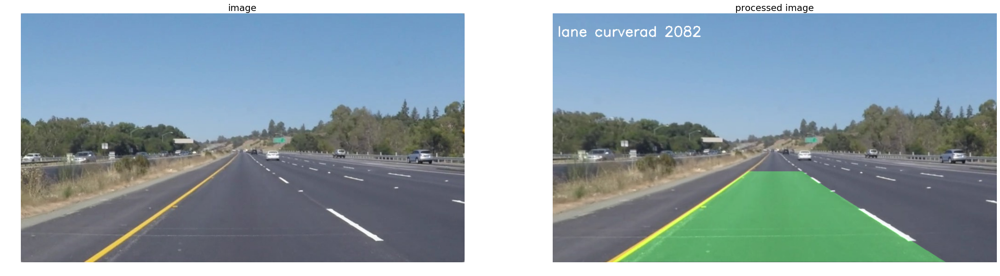

In [5]:
images = glob.glob('test_images/*.jpg')
image = mpimg.imread(images[1])
processed_image = process_and_warp_image(image)
plt.figure(figsize=(32, 32))
plt.rcParams.update({'font.size': 14})
plt.subplot(1, 2, 1)
plt.title("image")
plt.axis('off')
var_holder = plt.imshow(image)
plt.subplot(1, 2, 2)
plt.title("processed image")
plt.axis('off')
var_holder = plt.imshow(processed_image)
plt.show()

In [7]:
project_output = 'challenge_video_smooth.mp4'
video_file = VideoFileClip( 'challenge_video.mp4')
vid = video_file.fl_image(process_and_warp_image)
%time vid.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_output_smooth.mp4
[MoviePy] Writing video project_output_smooth.mp4


100%|█████████████████████████████████████▉| 1260/1261 [13:17<00:00,  1.46it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output_smooth.mp4 

Wall time: 13min 18s


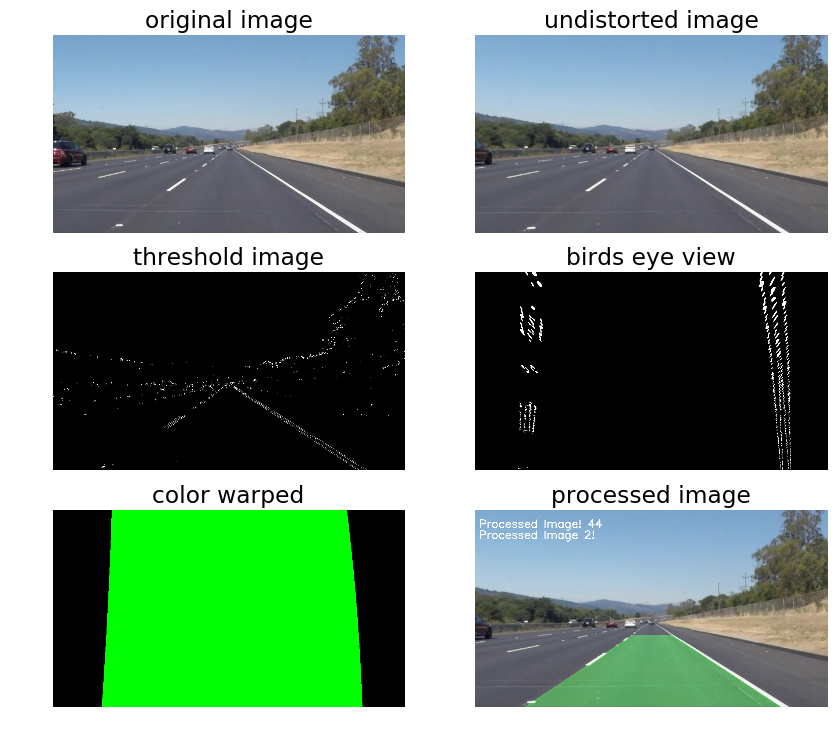

In [18]:
#video_file = VideoFileClip( 'project_video.mp4')
resized_shape = (960,540)
#video_file.save_frame("frame.jpg", t=25)
images = glob.glob('test_images/*.jpg')
image = mpimg.imread(images[0])
#image = mpimg.imread(images[0])
resized_image = cv2.resize(image,resized_shape, interpolation = cv2.INTER_CUBIC)
undistortd_image = cv2.undistort(resized_image, mtx, dist, None, mtx)
gradx = abs_sobel_thresh(undistortd_image, orient='x', sobel_kernel=5, thresh=(30, 100))
grady = abs_sobel_thresh(undistortd_image, orient='y', sobel_kernel=5, thresh=(30, 100))
mag_binary = mag_thresh(undistortd_image, sobel_kernel=5, mag_thresh=(30, 100))
dir_binary = dir_threshold(undistortd_image, sobel_kernel=5, thresh=(0.7, 1.3))
hls_thresh = hls_s_thresh(undistortd_image,thresh = (175, 255))
combined = np.zeros_like(hls_thresh)
combined[((gradx == 1) & (grady == 1))|hls_thresh == 1 | ((mag_binary == 1) & (dir_binary == 1))] = 1
src = np.float32([[150, 540],[850, 540],[555,350],[415,350]])
dst = np.float32([[150, 540],[850, 540],[850, 100],[150, 100] ])
M = cv2.getPerspectiveTransform(src, dst)
warped_image = cv2.warpPerspective(combined, M, resized_shape)

left_points, right_points = get_lane_lines(warped_image)
yvals = np.linspace(0, 100, num=101)*5.4
left_fit = np.polyfit( [i[1] for i in left_points],[i[0] for i in left_points], 2)
right_fit = np.polyfit( [i[1] for i in right_points],[i[0] for i in right_points], 2)
left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
warp_zero = np.zeros_like(hls_thresh).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
pts = np.hstack((pts_left, pts_right))
inv = cv2.getPerspectiveTransform(dst,src)
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
newwarp = cv2.warpPerspective(color_warp, inv, (resized_image.shape[1], resized_image.shape[0])) 
result = cv2.addWeighted(undistortd_image, 1, newwarp, 0.3, 0)
"Radius of Curvature = (m)"
"Vehicle is m left/right of center"
plt.figure(figsize=(10, 24))
plt.rcParams.update({'font.size': 14})
plt.subplot(8, 2, 1)
plt.title("original image")
plt.axis('off')
var_holder = plt.imshow(image)
plt.subplot(8, 2, 2)
plt.title("undistorted image")
plt.axis('off')
var_holder = plt.imshow(undistortd_image)
plt.subplot(8, 2, 3)
plt.title("threshold image")
plt.axis('off')
var_holder = plt.imshow(combined,cmap='gray')
plt.subplot(8, 2, 4)
plt.title("birds eye view")
plt.axis('off')
var_holder = plt.imshow(warped_image,cmap='gray')
plt.subplot(8, 2, 5)
plt.title("color warped")
plt.axis('off')
var_holder = plt.imshow(color_warp)
plt.subplot(8, 2, 6)
plt.title("processed image")
plt.axis('off')
font = cv2.FONT_HERSHEY_SIMPLEX
h = 44.3
cv2.putText(result,'Processed Image! %2d' %h,(10,50), font,  1,(255,255,255),2)
cv2.putText(result,'Processed Image 2!',(10,80), font,  1,(255,255,255),2)
var_holder = plt.imshow(result)
plt.show()

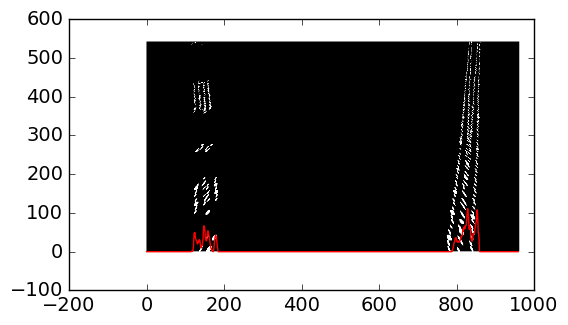

In [18]:
histogram = np.sum(warped_image[warped_image.shape[0]/4:,:], axis=0)
plt.imshow(warped_image,cmap='gray')
plt.plot(histogram,color='red')
plt.gca().invert_yaxis() 

(841, 500)
871.157205956
77.5136930215
474.335449489


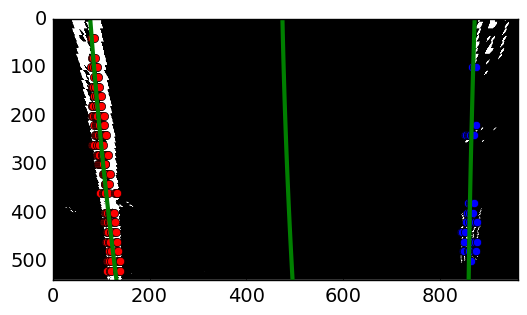

In [30]:
resized_shape = (960,540)
images = glob.glob('test_images/*.jpg')
image = mpimg.imread(images[1])
resized_image = cv2.resize(image,resized_shape, interpolation = cv2.INTER_CUBIC)
undistortd_image = cv2.undistort(resized_image, mtx, dist, None, mtx)
gradx = abs_sobel_thresh(undistortd_image, orient='x', sobel_kernel=5, thresh=(30, 100))
grady = abs_sobel_thresh(undistortd_image, orient='y', sobel_kernel=5, thresh=(30, 100))
mag_binary = mag_thresh(undistortd_image, sobel_kernel=5, mag_thresh=(30, 100))
dir_binary = dir_threshold(undistortd_image, sobel_kernel=5, thresh=(0.7, 1.3))
hls_thresh = hls_s_thresh(undistortd_image,thresh = (175, 255))
combined = np.zeros_like(hls_thresh)
combined[((gradx == 1) & (grady == 1))|hls_thresh == 1 | ((mag_binary == 1) & (dir_binary == 1))] = 1

src = np.float32([[150, 540],[850, 540],[555,350],[415,350]])
dst = np.float32([[150, 540],[850, 540],[850, 100],[150, 100] ])
M = cv2.getPerspectiveTransform(src, dst)
warped_image = cv2.warpPerspective(combined, M, resized_shape)

plt.imshow(warped_image,cmap='gray')
left_points,right_points = get_left_right_points(warped_image)
plt.plot([i[0] for i in left_points],[i[1] for i in left_points], 'o', color='red')
plt.plot([i[0] for i in right_points[1:]],[i[1] for i in right_points[1:]], 'o', color='blue')
yvals = np.linspace(0, 100, num=101)*5.4
left_fit = np.polyfit( [i[1] for i in left_points],[i[0] for i in left_points], 2)
get_sqaure_error(left_points, left_fit)
right_fit = np.polyfit( [i[1] for i in right_points],[i[0] for i in right_points], 2)
left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]
plt.xlim(0, 960)
plt.ylim(0, 540)
print(min(right_points, key= lambda x: x[0]))
pr = np.poly1d(right_fit)
pl = np.poly1d(left_fit)
def diff(y):
    return pl(y) +((pr(y) - pl(y))/2)
plt.plot(pr(yvals), yvals, color='green', linewidth=3)
plt.plot(pl(yvals), yvals, color='green', linewidth=3)
plt.plot(diff(yvals), yvals, color='green', linewidth=3)
plt.gca().invert_yaxis() 
print(pr(0))
print(pl(0))
print(diff(0))




In [29]:
max_image_point = np.max(yvals)
left_curverad = ((1 + (2*left_fit[0]*max_image_point + left_fit[1])**2)**1.5) /np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*max_image_point + right_fit[1])**2)**1.5) /np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

12108.629447 8099.45279254


In [30]:
y_eval = np.max(yvals)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) /np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) /np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

12108.629447 8099.45279254


In [31]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension
left_fit_cr = np.polyfit([y*ym_per_pix for x,y in left_points], [x*xm_per_pix for x,y in left_points], 2)
right_fit_cr = np.polyfit([y*ym_per_pix for x,y in right_points], [x*xm_per_pix for x,y in right_points], 2)
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
print("left curverad "+ str(round(left_curverad,2)) + "m, right_curverad " +str(round(right_curverad,2))+ "m")

left curverad 4045.09m, right_curverad 2786.25m
[ -4.15251605e-05   1.06058830e-01   8.68858643e+01] [ -6.30170660e-05  -4.95170846e-02   8.97127017e+02]


In [ ]:
"""
err_p_R = np.sum((right_fit-right_fit_prev)**2)/np.sum(right_fit_prev**2)
err_p_R = np.sqrt(err_p_R)
if err_p_R>0.05:
    right_fit = right_fit_prev
    left_fit =  left_fit_prev
else:
    right_fit = .05*right_fit+.95*right_fit_prev
    left_fit =  .05* left_fit+.95* left_fit_prev


right_y = np.arange(11)*img_size[0]/10
right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]

left_y = np.arange(11)*img_size[0]/10
left_fitx = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    
"""

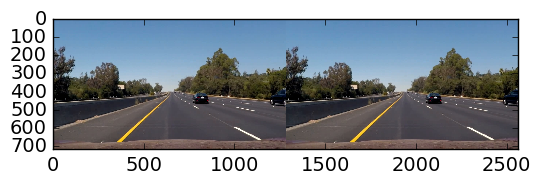

In [25]:
import sys
from PIL import Image

images = map(Image.open, ['frame.png', 'frame.jpg'])

def concat_images(imga, imgb):
    """
    Combines two color image ndarrays side-by-side.
    """
    ha,wa = imga.shape[:2]
    hb,wb = imgb.shape[:2]
    max_height = np.max([ha, hb])
    total_width = wa+wb
    new_img = np.zeros(shape=(max_height, total_width, 3), dtype=np.uint8)
    new_img[:ha,:wa]=imga
    new_img[:hb,wa:wa+wb]=imgb
    return new_img
imga = mpimg.imread("frame.jpg")
imgb = mpimg.imread("frame.jpg")
conc = concat_images(imga, imgb)
plt.imshow(conc)